<img src="https://github.com/djp840/MSDS_458_Public/blob/master/images/NorthwesternHeader.png?raw=1">

## MSDS422 Assignment 05
<div class="alert alert-block alert-success">
    <b>More Technical</b>: Throughout the notebook. This types of boxes provide more technical details and extra references about what you are seeing. They contain helpful tips, but you can safely skip them the first time you run through the code.
</div>

## Import packages 

In [98]:
# Helper libraries
import numpy as np
import pandas as pd
from time import time
from collections import Counter

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls

from sklearn import metrics
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [99]:
%matplotlib inline

<div class="alert alert-block alert-info">
    <b>Suppress warning messages</b></div>

In [100]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

### Mount Google Drive to Colab Enviorment

In [ ]:
#from google.colab import drive
#drive.mount('/content/gdrive')

### Load Data (Local Directory)

In [845]:
training_df = pd.read_csv("MSDS422_train.csv")

In [559]:
print(training_df.shape)

(42000, 785)


In [560]:
training_df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [844]:
training_df.describe()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
count,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,...,42000.000000,42000.000000,42000.000000,42000.00000,42000.000000,42000.000000,42000.0,42000.0,42000.0,42000.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.219286,0.117095,0.059024,0.02019,0.017238,0.002857,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.312890,4.633819,3.274488,1.75987,1.894498,0.414264,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,254.000000,253.000000,253.00000,254.000000,62.000000,0.0,0.0,0.0,0.0


### Save the labels to a Pandas Series 

In [846]:
target = training_df['label']
# Drop the label feature
training_df.drop("label",axis=1,inplace=True)

In [562]:
target.shape

(42000,)

### Standardize Training Data

In [563]:
X = training_df.values
X_std = StandardScaler().fit_transform(X)

# Calculating Eigenvectors and eigenvalues of Cov matirx
mean_vec = np.mean(X_std, axis=0)
cov_mat = np.cov(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)
# Create a list of (eigenvalue, eigenvector) tuples
eig_pairs = [ (np.abs(eig_vals[i]),eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the eigenvalue, eigenvector pair from high to low
eig_pairs.sort(key = lambda x: x[0], reverse= True)

# Calculation of Explained Variance from the eigenvalues
tot = sum(eig_vals)
var_exp = [(i/tot)*100 for i in sorted(eig_vals, reverse=True)] # Individual explained variance
cum_var_exp = np.cumsum(var_exp) # Cumulative explained variance

### PCA analysis

In [298]:
X = training_df.values
X_std = StandardScaler().fit_transform(X)

mean_vec=np.mean(X_std,axis=0)
cov_mat=np.cov(X_std.T)
eigvalues ,eigvectors =np.linalg.eig(cov_mat)

eigpairs=[(np.abs(eigvalues[i]),eigvectors[:,i] )for i in range(len(eigvalues))]


eigpairs.sort(key=lambda x:x[0],reverse=True)
   
tot=sum(eigvalues)
var_exp=[(i/tot)*100 for i in sorted(eigvalues,reverse=True)]
cum_var_exp=np.cumsum(var_exp)

<div class="alert alert-block alert-info">
<b>Plotly Python Open Source Graphing Library</b><br> 
https://plotly.com/python/<br>
Plotly's Python graphing library makes interactive, publication-quality graphs. Examples of how to make line plots, scatter plots, area charts, bar charts, error bars, box plots, histograms, heatmaps, subplots, multiple-axes, polar charts, and bubble charts</div>

In [17]:
trace1 = go.Scatter(
    x=list(range(784)),
    y= cum_var_exp,
    mode='lines+markers',
    name="'Cumulative Explained Variance'",
   
    line = dict(
        shape='spline',
        color = 'goldenrod'
    )
)
trace2 = go.Scatter(
    x=list(range(784)),
    y= var_exp,
    mode='lines+markers',
    name="'Individual Explained Variance'",
 
     line = dict(
        shape='linear',
        color = 'black'
    )
)
fig = tls.make_subplots(insets=[{'cell': (1,1), 'l': 0.7, 'b': 0.5}],
                          print_grid=True)

fig.append_trace(trace1,1,1)
fig.append_trace(trace2,1,1)


fig.layout.title='explained Variance plots'
fig.layout.xaxis=dict(range=[0,800],title='Feature columns')
fig.layout.yaxis=dict(range=[0,100],title='explained variance')


py.iplot(fig,filename='inset example')

C:\Users\Husein Adenwala\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



This is the format of your plot grid:
[ (1,1) x,y ]

With insets:
[ x2,y2 ] over [ (1,1) x,y ]



In [18]:
pca=PCA(30)
pca.fit(X_std)

PCA(n_components=30)

In [19]:
X_pca=pca.transform(X_std)

In [20]:
X_pca.shape

(42000, 30)

In [21]:
X_std.shape

(42000, 784)

In [22]:
eigenvectors=pca.components_
eigenvectors.shape

(30, 784)

### Plotting Eigenvector

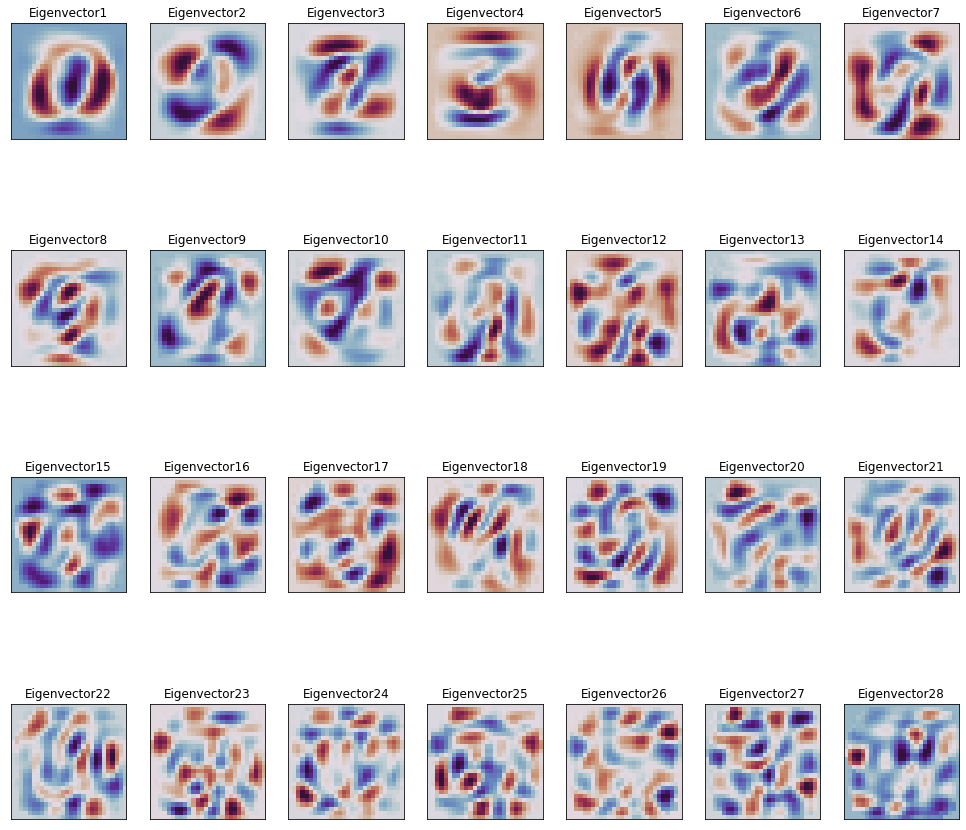

In [23]:
plt.figure(figsize=(17,16))

x_row=4
y_col=7

for i in list(range(x_row*y_col)):
    
    plt.subplot(x_row,y_col,i+1)
    plt.imshow(eigenvectors[i].reshape(28,28),cmap='twilight_shifted')
    title_='Eigenvector'+str(i+1)
    plt.title(title_)
    plt.xticks(())
    plt.yticks(())
plt.show()    

### Plotting MNIST Data

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

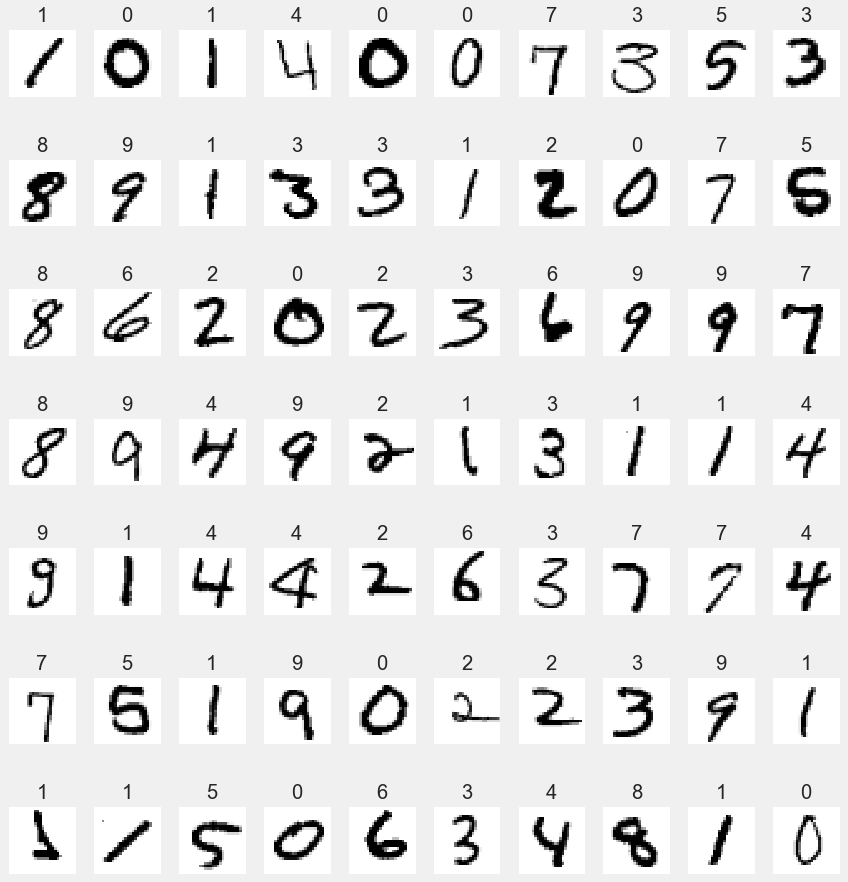

In [847]:
plt.figure(figsize=(12,13))

for i in list(range(0,70)):
    plt.subplot(7,10,i+1)
    plt.title(target[i])
    plt.imshow(training_df.iloc[i].values.reshape(28,28), interpolation = "none", cmap='binary')
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
               
plt.tight_layout

### Standardising Data and Implementing PCA

<div class="alert alert-block alert-info">
    <b>sklearn.decomposition.PCA</b><br> 
    https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
    </div>

In [942]:
X_=training_df
X_std_=StandardScaler().fit_transform(X_)
pca_=PCA(228)
X_140d=pca_.fit_transform(X_std_)
Target=target

# df wihtout PCA

In [938]:
X_=training_df
X_140d=StandardScaler().fit_transform(X_)

In [301]:
print(X_140d.shape)

(42000, 320)


In [956]:
kmeans.cluster_centers_

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Visualisation of PCA Representations

trace = go.Scatter(
    x = X_140d[:,0],
    y = X_140d[:,1],
    name = str(Target),
    
    mode = 'markers',
    text = Target,
    showlegend = False,
    marker = dict(
        size = 8,
        color = Target,
        colorscale ='Jet',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),
        
        opacity = 0.8
    )
)

data=[trace]

layout=go.Layout(title='PCA',
                hovermode='closest',
                xaxis=dict(
                    title='First principal direction',
                    ticklen=5,
                    zeroline=False),
                 yaxis=dict(
                 title='Second principal direction',
                 ticklen=5
            ),
                 showlegend=True
                
                    
                )
fig=dict(data=data,layout=layout)
py.iplot(fig,filename='pca')

### Kmeans Clustering

<div class="alert alert-block alert-info">
    <b>sklearn.cluster.KMeans</b><br> 
    https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
    </div>

In [1019]:
print("n_clusters: %d, \t n_samples %d, \t n_features %d"
      % (10, X_140d.shape[0], X_140d.shape[1]))

kmeans=KMeans(10)
t0 = time()
X_clustered=kmeans.fit_predict(X_140d)


print(82 * '_')
print('init\t\ttime\tinertia\t\t homo\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.4f'
% ('PCA Kmeans', (time() - t0), kmeans.inertia_,
metrics.homogeneity_score(target, X_clustered),
metrics.completeness_score(target, X_clustered),
metrics.v_measure_score(target, X_clustered),
metrics.adjusted_rand_score(target, X_clustered),
metrics.adjusted_mutual_info_score(target,  X_clustered),
metrics.silhouette_score(X_140d, X_clustered)))

n_clusters: 10, 	 n_samples 42000, 	 n_features 228
__________________________________________________________________________________
init		time	inertia		 homo	compl	v-meas	ARI	AMI	silhouette
PCA Kmeans	6.00s	22058233	0.419	0.441	0.429	0.318	0.429	0.0200


In [1036]:
print("n_clusters: %d, \t n_samples %d, \t n_features %d"
      % (10, X_std_.shape[0], X_std_.shape[1]))

kmeans=KMeans(10)
t0 = time()
X_clustered=kmeans.fit_predict(training_df)


print(82 * '_')
print('init\t\ttime\tinertia\t\t homo\tcompl\tv-meas\tARI\tAMI\tsilhouette')
print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.4f'
% ('Kmeans', (time() - t0), kmeans.inertia_,
metrics.homogeneity_score(target, X_clustered),
metrics.completeness_score(target, X_clustered),
metrics.v_measure_score(target, X_clustered),
metrics.adjusted_rand_score(target, X_clustered),
metrics.adjusted_mutual_info_score(target,  X_clustered),
metrics.silhouette_score(training_df, X_clustered )))

n_clusters: 10, 	 n_samples 42000, 	 n_features 784
__________________________________________________________________________________
init		time	inertia		 homo	compl	v-meas	ARI	AMI	silhouette
Kmeans   	14.59s	107176909853	0.486	0.498	0.492	0.362	0.492	0.0586


In [911]:
metrics.silhouette_score(X_140d, X_clustered,metric='euclidean',
                                    sample_size=42000)

0.018740676957891195

In [1026]:
type(target)

pandas.core.series.Series

In [664]:
from sklearn.neighbors import KNeighborsClassifier
Kmeans= KNeighborsClassifier( 10)
X_clustered=kmeans.fit(X_std, Target)

In [666]:
X_clustered = kmeans.predict(X_std)

In [742]:
kmeans=KMeans(10,init='k-means++', n_init=10, max_iter=1000, random_state=10)


In [755]:
X_clustered=kmeans.fit_predict(X_std)

In [641]:
training_df.describe()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
count,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,...,42000.000000,42000.000000,42000.000000,42000.00000,42000.000000,42000.000000,42000.0,42000.0,42000.0,42000.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.219286,0.117095,0.059024,0.02019,0.017238,0.002857,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.312890,4.633819,3.274488,1.75987,1.894498,0.414264,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,254.000000,253.000000,253.00000,254.000000,62.000000,0.0,0.0,0.0,0.0


In [1040]:
tracekmeans = go.Scatter(x=X_140d[:, 0], y= X_140d[:, 1], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))
centroids = kmeans.cluster_centers_

t

layout=go.Layout(title='Kmeans clustering',
                 hovermode='closest',
                 xaxis=dict(title='first principal direction',
                           ticklen=5,
                           zeroline=False,
                           gridwidth=2),
                 yaxis=dict(title='second principal component',
                           ticklen=5,
                           gridwidth=2),
                 showlegend=True
                     )

data = [tracekmeans]
fig1 = dict(data=data, layout= layout)
py.iplot(fig1, filename="svm")

<function matplotlib.pyplot.show(*args, **kw)>

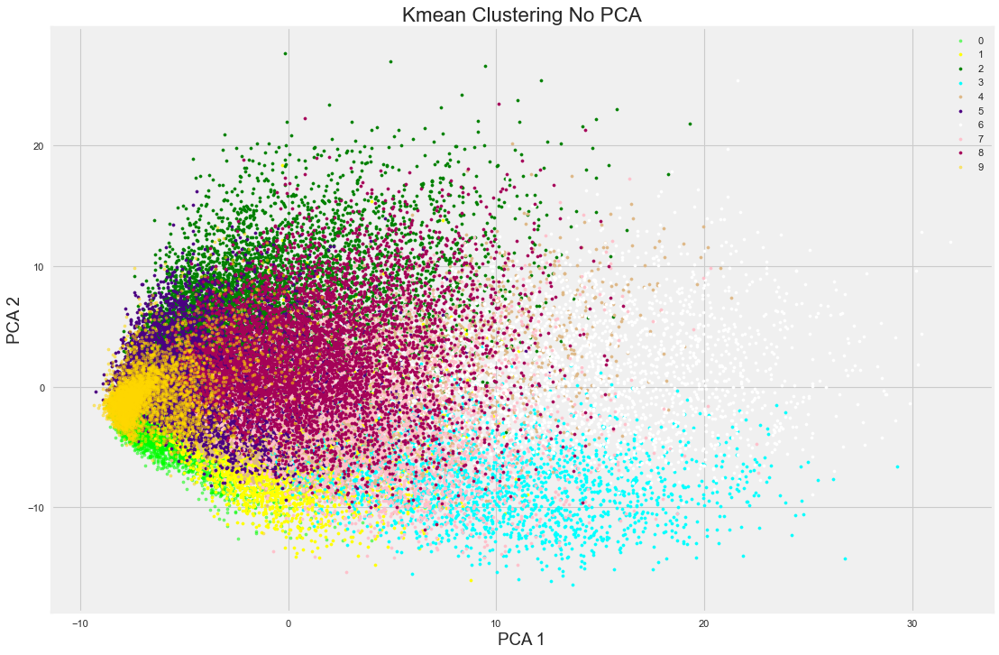

In [1039]:
# Memvisualkan hasil klusterplt.scatter(x_scaled[kmeans.labels_==0,0],x_scaled[kmeans.labels_==0,1],s=80,c='magenta',label='Careful')
from matplotlib.pyplot import figure
figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='w')
plt.scatter(X_140d[kmeans.labels_==0,0],X_140d[kmeans.labels_==0,1],s=8,c='lime',label='0',alpha = 0.5)
plt.scatter(X_140d[kmeans.labels_==1,0],X_140d[kmeans.labels_==1,1],s=8,c='yellow',label='1')
plt.scatter(X_140d[kmeans.labels_==2,0],X_140d[kmeans.labels_==2,1],s=8,c='green',label='2')
plt.scatter(X_140d[kmeans.labels_==3,0],X_140d[kmeans.labels_==3,1],s=8,c='cyan',label='3')
plt.scatter(X_140d[kmeans.labels_==4,0],X_140d[kmeans.labels_==4,1],s=8,c='burlywood',label='4')
plt.scatter(X_140d[kmeans.labels_==5,0],X_140d[kmeans.labels_==5,1],s=8,c='indigo',label='5')
plt.scatter(X_140d[kmeans.labels_==6,0],X_140d[kmeans.labels_==6,1],s=8,c='w',label='6')
plt.scatter(X_140d[kmeans.labels_==7,0],X_140d[kmeans.labels_==7,1],s=8,c='pink',label='7')
plt.scatter(X_140d[kmeans.labels_==8,0],X_140d[kmeans.labels_==8,1],s=8,c='m',label='8')
plt.scatter(X_140d[kmeans.labels_==9,0],X_140d[kmeans.labels_==9,1],s=8,c='gold',label='9',alpha = 0.5)
#plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1],marker = "o", alpha = 0.7,s=200,c='black',label='Centroids')

plt.title('Kmean Clustering No PCA')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(prop={'size': 10})
plt.show 

In [960]:
kmeans.cluster_centers_[:,1]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [809]:
X_140d[kmeans.labels_==1,0]

IndexError: boolean index did not match indexed array along dimension 0; dimension is 42000 but corresponding boolean dimension is 28000

In [810]:
kmeans.labels_==1,0

(array([False, False, False, ...,  True, False, False]), 0)

In [1031]:
x_clusters_df=pd.DataFrame(X_clustered, dtype=int)
x_clusters_df.columns=['Cluster']
targeted_df=pd.DataFrame(Target,dtype=int)

### Cross Tablulation 

<div class="alert alert-block alert-info">
    <b>pandas.crosstab</b><br> 
   https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.crosstab.html
    </div>

In [1032]:
cfm =pd.crosstab(targeted_df.label, x_clusters_df.Cluster, margins= True)

In [1033]:
cf =pd.crosstab(targeted_df.label, x_clusters_df.Cluster)

In [1034]:
sum((np.diag(cf)))

3614

In [1035]:
cf

Cluster,0,1,2,3,4,5,6,7,8,9
label,,,,,,,,,,
0,57,3,6,2,8,104,2247,1541,141,23
1,7,3,4,2628,2029,5,0,0,5,3
2,131,2892,46,249,271,132,12,111,211,122
3,676,128,32,299,63,36,10,205,2786,116
4,13,26,1295,105,211,117,8,19,0,2278
5,739,9,232,134,527,64,41,523,1286,240
6,39,45,2,213,149,3323,81,212,19,54
7,11,29,2599,225,201,5,10,11,4,1306
8,2495,25,120,175,289,38,27,51,728,115


In [762]:
dic=  {8:0,
      4:1,
      3:2,
      2:3,
     5:4,
      7:5,
      9:6,
      1:7,
      6:8,
       0:9      
      
     }

In [763]:
x_clusters_df['label']= x_clusters_df.Cluster.map(dic).astype(int)

In [764]:
cf =pd.crosstab(targeted_df.label, x_clusters_df.label)

In [766]:
x_clusters_df.head()

,Cluster,label
0,4,1
1,8,0
2,4,1
3,5,4
4,8,0


In [615]:
def infer_cluster_labels(kmeans, actual_labels):
    inferred_labels = {}

    for i in range(kmeans.n_clusters):

    # find index of points in cluster
        labels = []
        index = np.where(kmeans.labels_ == i)

    # append actual labels for each point in cluster
        labels.append(actual_labels[index])

    # determine most common label
        if len(labels[0]) == 1:
            counts = np.bincount(labels[0])
        else:
            counts = np.bincount(np.squeeze(labels))

    # assign the cluster to a value in the inferred_labels dictionary
        if np.argmax(counts) in inferred_labels:
        # append the new number to the existing array at this slot
            inferred_labels[np.argmax(counts)].append(i)
        else:
        # create a new array in this slot
            inferred_labels[np.argmax(counts)] = [i]

    #print(labels)
    #print('Cluster: {}, label: {}'.format(i, np.argmax(counts)))
    
    return inferred_labels

def infer_data_labels(X_labels, cluster_labels):
  # empty array of len(X)
    predicted_labels = np.zeros(len(X_labels)).astype(np.uint8)

    for i, cluster in enumerate(X_labels):
        for key, value in cluster_labels.items():
            if cluster in value:
                predicted_labels[i] = key
            
    return predicted_labels

# test the infer_cluster_labels() and infer_data_labels() functions

cluster_labels = infer_cluster_labels(kmeans, t )
X_clusters = kmeans.predict(X_std)
predicted_labels = infer_data_labels(X_clusters, cluster_labels)
print (predicted_labels[:20])
print (t[:20])


[1 0 1 4 0 3 7 3 3 3 5 7 1 3 3 1 3 2 7 2]
[1 0 1 4 0 0 7 3 5 3 8 9 1 3 3 1 2 0 7 5]


In [616]:
pd.crosstab(targeted_df.label, predicted_labels)

col_0,0,1,2,3,4,5,6,7
label,,,,,,,,
0,2347,15,331,625,9,441,356,8
1,0,4543,13,14,0,103,8,3
2,21,491,2547,469,109,76,409,55
3,6,422,840,2650,113,136,62,122
4,34,317,44,2,2414,609,78,574
5,18,321,191,1290,173,1633,74,95
6,147,296,467,38,20,95,3068,6
7,12,306,15,7,1004,90,3,2964
8,25,761,98,1366,214,1435,25,139


In [779]:
test_df = pd.read_csv("MSDS422_test.csv")

In [780]:
X_test=test_df
X_std_test= StandardScaler().fit_transform(X_test)


In [781]:
X_clustered_test =kmeans.fit_predict(X_std_test)

In [782]:
sub =pd.DataFrame(X_clustered_test, columns=["Label_d"])


In [783]:
sub["ImageId"] = np.arange(1,28001,1)

In [784]:
sub = sub[['ImageId','Label_d']]

In [785]:
sub['Label']= sub['Label_d'].map(dic).astype(int)

In [787]:
sub=sub.drop(columns='Label_d')

In [789]:
sub.to_csv('MINST_kagel.csv', index= False)

In [513]:
test_df.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [854]:
pca_test =PCA(320)
X_140_test=pca_test.fit_transform(X_std_test)

In [451]:
kmeans=KMeans(10)
X_clustered_test =kmeans.fit_predict(X_140_test)

In [455]:
X_clustered_test.shape

(28000,)

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.1358503002899895
For n_clusters = 3 The average silhouette_score is : 0.05045011432823784
For n_clusters = 4 The average silhouette_score is : 0.045188306116045615
For n_clusters = 5 The average silhouette_score is : 0.038562754177665116
For n_clusters = 6 The average silhouette_score is : 0.008491663634972224
For n_clusters = 7 The average silhouette_score is : 0.000591911358764725
For n_clusters = 8 The average silhouette_score is : 0.009428174969705928
For n_clusters = 9 The average silhouette_score is : 0.019950326259297685
For n_clusters = 10 The average silhouette_score is : 0.018820192775440295
For n_clusters = 11 The average silhouette_score is : 0.019131779986122636
For n_clusters = 12 The average silhouette_score is : 0.019619440117120898


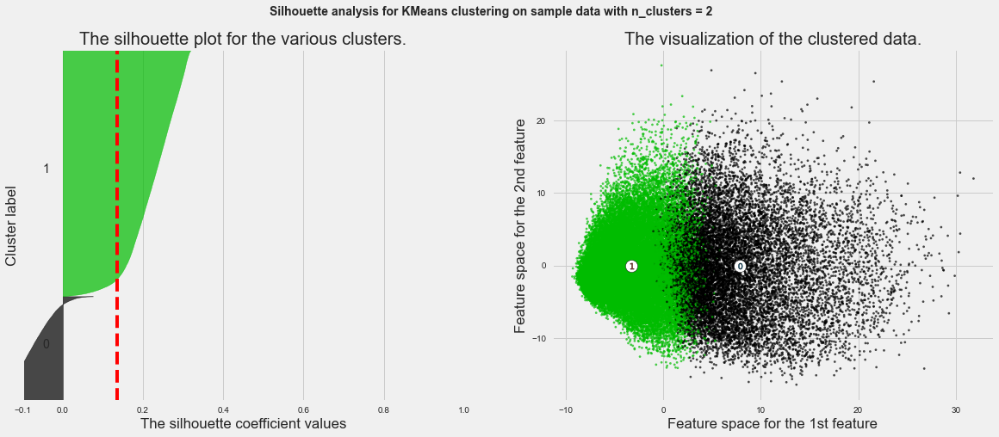

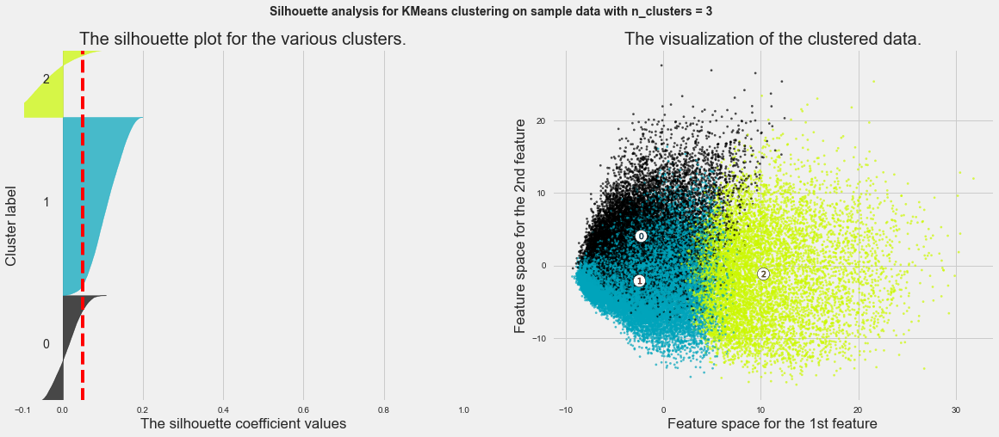

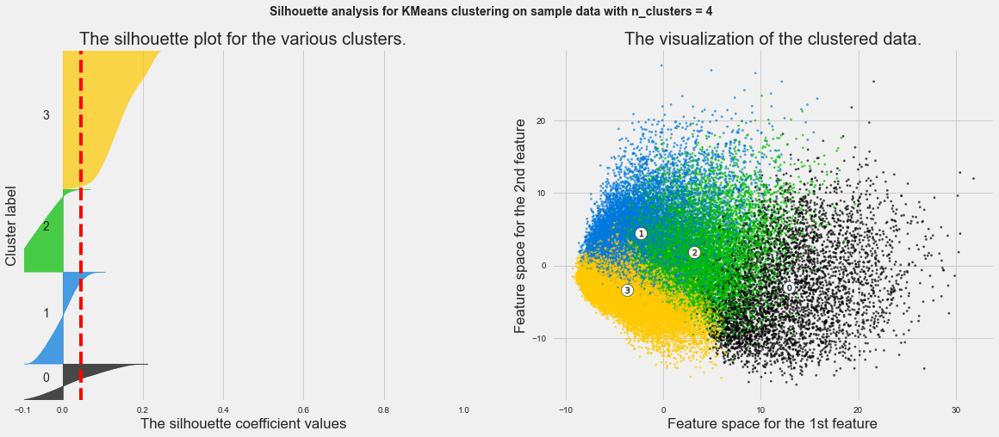

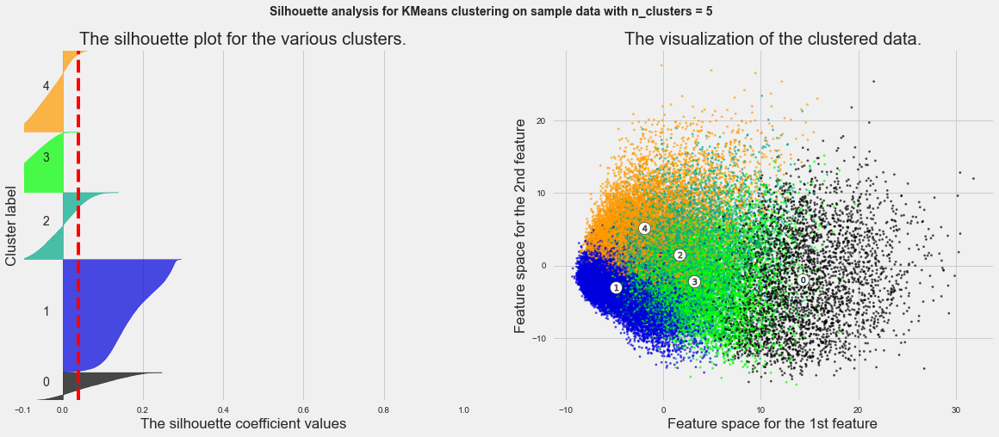

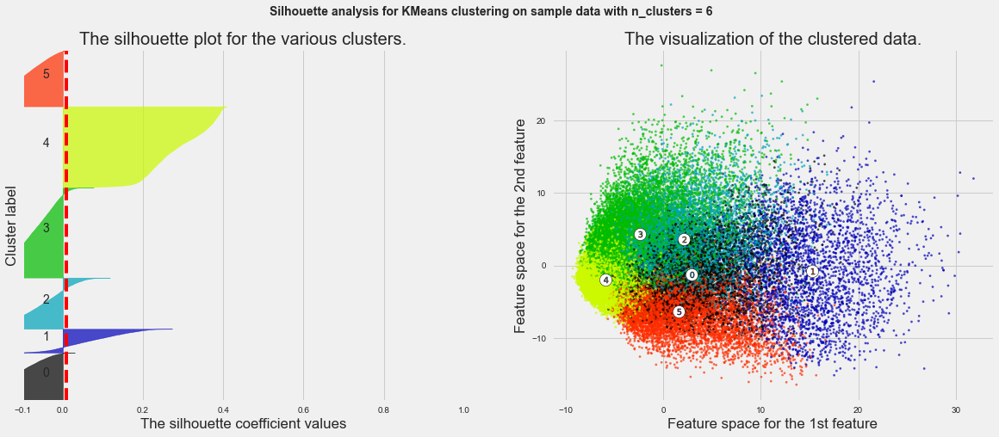

...

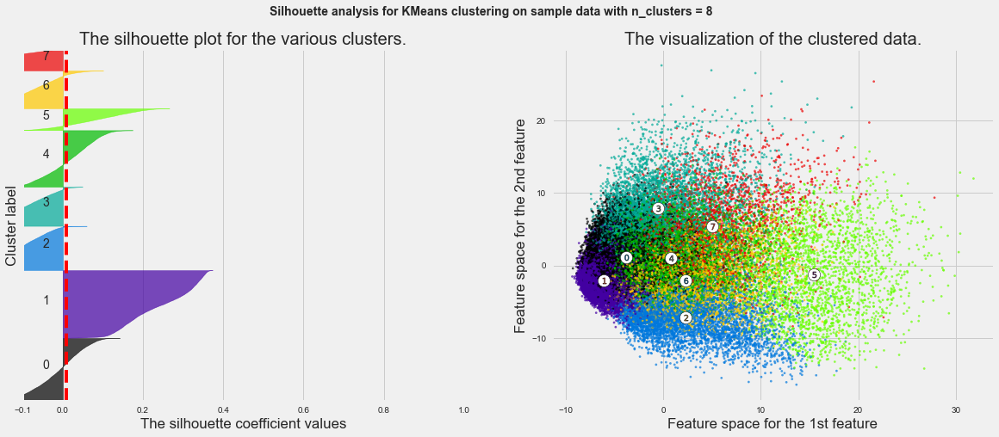

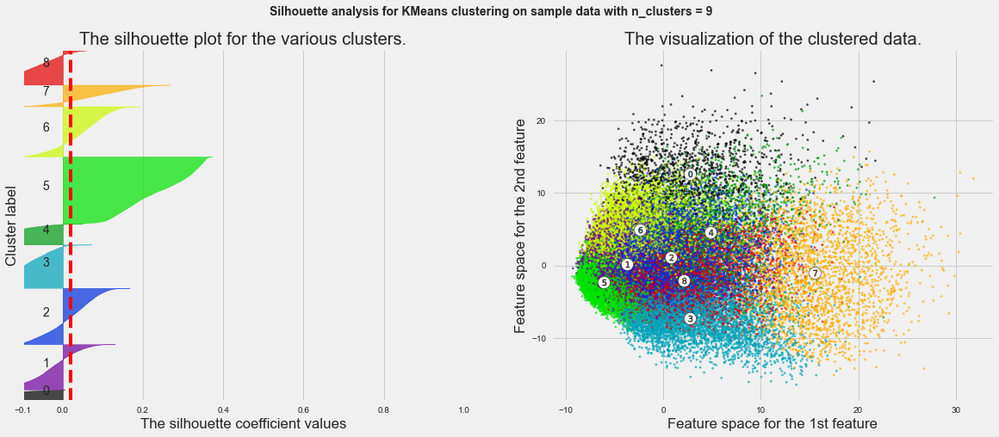

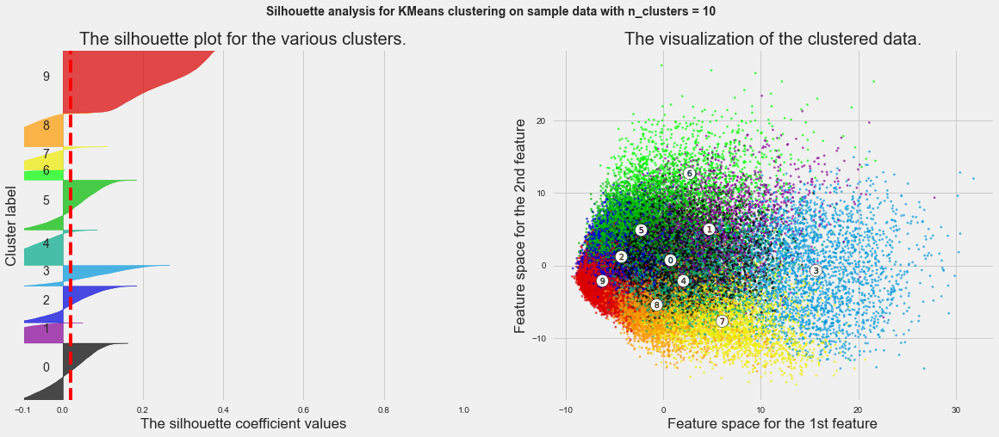

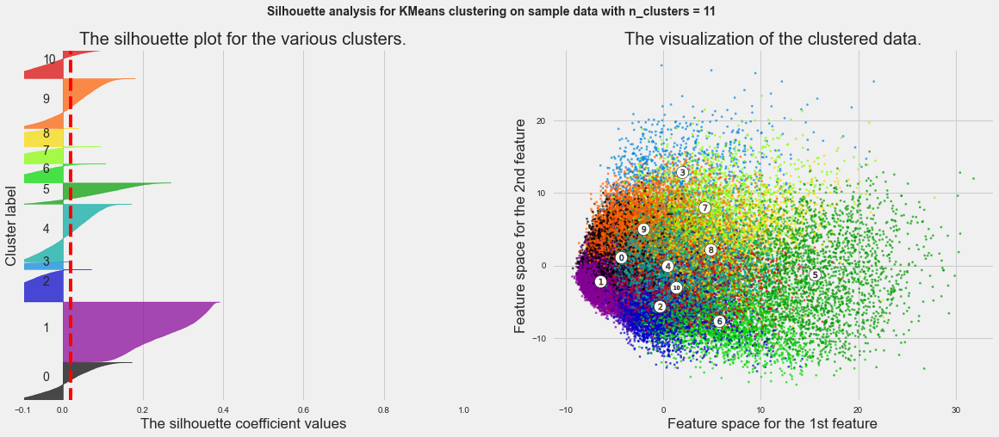

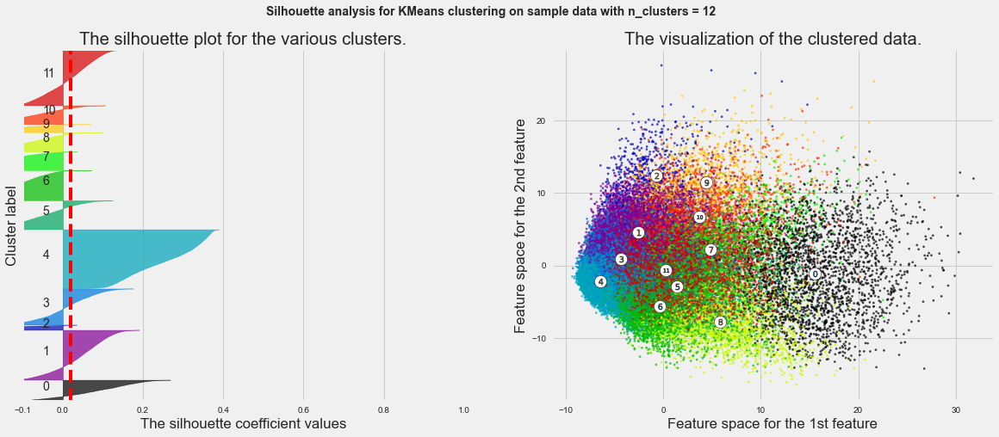

In [1023]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
X, y =  X_140d,Target

# For reproducibility

range_n_clusters = [2, 3, 4, 5, 6,7 ,8,9,10,11,12]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [144]:
print(__doc__)

# Author: Olivier Grisel <olivier.grisel@ensta.org>
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
from time import time
from sklearn import metrics

def uniform_labelings_scores(score_func, n_samples, n_clusters_range,
                             fixed_n_classes=None, n_runs=5, seed=42):
    """Compute score for 2 random uniform cluster labelings.

    Both random labelings have the same number of clusters for each value
    possible value in ``n_clusters_range``.

    When fixed_n_classes is not None the first labeling is considered a ground
    truth class assignment with fixed number of classes.
    """
    random_labels = np.random.RandomState(seed).randint
    scores = np.zeros((len(n_clusters_range), n_runs))

    if fixed_n_classes is not None:
        labels_a = random_labels(low=0, high=fixed_n_classes, size=n_samples)

    for i, k in enumerate(n_clusters_range):
        for j in range(n_runs):
            if fixed_n_classes is None:
                labels_a = random_labels(low=0, high=k, size=n_samples)
            labels_b = random_labels(low=0, high=k, size=n_samples)
            scores[i, j] = score_func(labels_a, labels_b)
    return scores


def ami_score(U, V):
    return metrics.adjusted_mutual_info_score(U, V)

score_funcs = [
    metrics.adjusted_rand_score,
    metrics.v_measure_score,
    ami_score,
    metrics.mutual_info_score,
]

# 2 independent random clusterings with equal cluster number

n_samples = 100
n_clusters_range = np.linspace(2, n_samples, 10).astype(np.int)

plt.figure(1)

plots = []
names = []
for score_func in score_funcs:
    print("Computing %s for %d values of n_clusters and n_samples=%d"
          % (score_func.__name__, len(n_clusters_range), n_samples))

    t0 = time()
    scores = uniform_labelings_scores(score_func, n_samples, n_clusters_range)
    print("done in %0.3fs" % (time() - t0))
    plots.append(plt.errorbar(
        n_clusters_range, np.median(scores, axis=1), scores.std(axis=1))[0])
    names.append(score_func.__name__)

plt.title("Clustering measures for 2 random uniform labelings\n"
          "with equal number of clusters")
plt.xlabel('Number of clusters (Number of samples is fixed to %d)' % n_samples)
plt.ylabel('Score value')
plt.legend(plots, names)
plt.ylim(bottom=-0.05, top=1.05)


# Random labeling with varying n_clusters against ground class labels
# with fixed number of clusters

n_samples = 1000
n_clusters_range = np.linspace(2, 10, 1).astype(np.int)
n_classes = 10

plt.figure(2)

plots = []
names = []
for score_func in score_funcs:
    print("Computing %s for %d values of n_clusters and n_samples=%d"
          % (score_func.__name__, len(n_clusters_range), n_samples))

    t0 = time()
    scores = uniform_labelings_scores(score_func, n_samples, n_clusters_range,
                                      fixed_n_classes=n_classes)
    print("done in %0.3fs" % (time() - t0))
    plots.append(plt.errorbar(
        n_clusters_range, scores.mean(axis=1), scores.std(axis=1))[0])
    names.append(score_func.__name__)

plt.title("Clustering measures for random uniform labeling\n"
          "against reference assignment with %d classes" % n_classes)
plt.xlabel('Number of clusters (Number of samples is fixed to %d)' % n_samples)
plt.ylabel('Score value')
plt.ylim(bottom=-0.05, top=1.05)
plt.legend(plots, names)
plt.show()

0        1
1        0
2        1
3        4
4        0
        ..
41995    0
41996    1
41997    7
41998    6
41999    9
Name: label, Length: 42000, dtype: int64

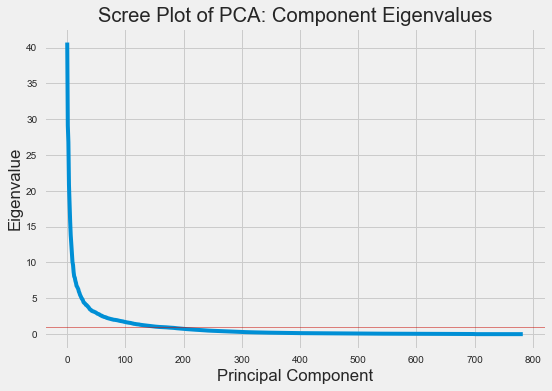

In [1025]:
pca = PCA()
pca.fit(X_std_)

def scree_plot():

    from matplotlib.pyplot import figure, show
    from matplotlib.ticker import MaxNLocator

    ax = figure().gca()
    ax.plot(pca.explained_variance_)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xlabel('Principal Component')
    plt.ylabel('Eigenvalue')
    plt.axhline(y=1, linewidth=1, color='r', alpha=0.5)
    plt.title('Scree Plot of PCA: Component Eigenvalues')
    show()

scree_plot()

In [410]:
  ax = figure().gca()

NameError: name 'figure' is not defined

In [ ]:
from scipy.misc import comb
from itertools import combinations
import numpy as np

def check_clusterings(labels_true, labels_pred):
    """Check that the two clusterings matching 1D integer arrays."""
    labels_true = np.asarray(labels_true)
    labels_pred = np.asarray(labels_pred)    
    # input checks
    if labels_true.ndim != 1:
        raise ValueError(
            "labels_true must be 1D: shape is %r" % (labels_true.shape,))
    if labels_pred.ndim != 1:
        raise ValueError(
            "labels_pred must be 1D: shape is %r" % (labels_pred.shape,))
    if labels_true.shape != labels_pred.shape:
        raise ValueError(
            "labels_true and labels_pred must have same size, got %d and %d"
            % (labels_true.shape[0], labels_pred.shape[0]))
    return labels_true, labels_pred

def rand_score (labels_true, labels_pred):
"""given the true and predicted labels, it will return the Rand Index."""
    check_clusterings(labels_true, labels_pred)
    my_pair = list(combinations(range(len(labels_true)), 2)) #create list of all combinations with the length of labels.
    def is_equal(x):
        return (x[0]==x[1])
    my_a = 0
    my_b = 0
    for i in range(len(my_pair)):
            if(is_equal((labels_true[my_pair[i][0]],labels_true[my_pair[i][1]])) == is_equal((labels_pred[my_pair[i][0]],labels_pred[my_pair[i][1]])) 
               and is_equal((labels_pred[my_pair[i][0]],labels_pred[my_pair[i][1]])) == True):
                my_a += 1
            if(is_equal((labels_true[my_pair[i][0]],labels_true[my_pair[i][1]])) == is_equal((labels_pred[my_pair[i][0]],labels_pred[my_pair[i][1]])) 
               and is_equal((labels_pred[my_pair[i][0]],labels_pred[my_pair[i][1]])) == False):
                my_b += 1
    my_denom = comb(len(labels_true),2)
    ri = (my_a + my_b) / my_denom
    return ri

In [236]:
centroids = np.asarray([[0,0],[1,1],[2,2], [3,3],[4,4],[5,5],[6,6],[7,7],[8,8],[9,9]])

In [257]:
kmeans = KMeans(n_clusters=10, random_state=0, max_iter=1000).fit(X_std)
kmeans.labels_

p= kmeans.predict(X_std)

kmeans.cluster_centers_[1]

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -5.28063530e-03, -6.87837385e-03, -4.87955846e-03, -4.87955846e-03,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -4.87955846e-03,  8.27667351e-03,  1.48974821e-01,  1.79675106e-01,
        2.60628409e-01,  2.95392253e-01,  1.97741498e-01,  6.65541564e-02,
       -3.37977278e-03, -2.43120948e-02, -3.12669227e-02, -2.99246677e-02,
       -2.98195932e-02, -2.79072967e-02, -2.35148150e-02, -1.75808468e-02,
       -1.53656634e-02, -9.63815429e-03, -8.30613350e-03, -5.23595180e-03,
        0.00000000e+00,  

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

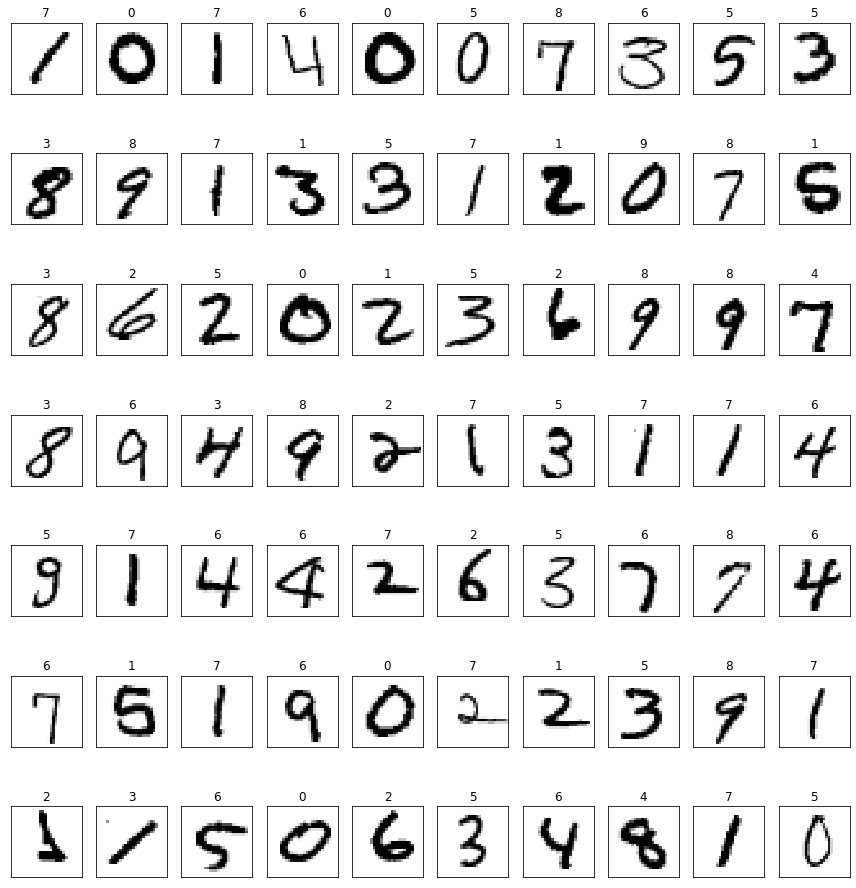

In [271]:
plt.figure(figsize=(12,13))

for i in list(range(0,70)):
    plt.subplot(7,10,i+1)
    plt.title(p[i])
    plt.imshow(training_df.iloc[i].values.reshape(28,28), interpolation = "none", cmap='binary')
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
               
plt.tight_layout

In [270]:
def infer_cluster_labels(kmeans, actual_labels):
  inferred_labels = {}

for i in range(kmeans.n_clusters):

    # find index of points in cluster
    labels = []
    index = np.where(kmeans.labels_ == i)

    # append actual labels for each point in cluster
    labels.append(actual_labels[index])

    # determine most common label
    if len(labels[0]) == 1:
        counts = np.bincount(labels[0])
    else:
        counts = np.bincount(np.squeeze(labels))

    # assign the cluster to a value in the inferred_labels dictionary
    if np.argmax(counts) in inferred_labels:
        # append the new number to the existing array at this slot
        inferred_labels[np.argmax(counts)].append(i)
    else:
        # create a new array in this slot
        inferred_labels[np.argmax(counts)] = [i]

    #print(labels)
    #print('Cluster: {}, label: {}'.format(i, np.argmax(counts)))
    
return inferred_labels

def infer_data_labels(X_labels, cluster_labels):
  # empty array of len(X)
    predicted_labels = np.zeros(len(X_labels)).astype(np.uint8)

for i, cluster in enumerate(X_labels):
    for key, value in cluster_labels.items():
        if cluster in value:
            predicted_labels[i] = key
            
return predicted_labels

# test the infer_cluster_labels() and infer_data_labels() functions

cluster_labels = infer_cluster_labels(kmeans, )
X_clusters = kmeans.predict(X)
predicted_labels = infer_data_labels(X_clusters, cluster_labels)
print( predicted_labels[:20])
print (Y[:20])

NameError: name 'actual_labels' is not defined

Automatically created module for IPython interactive environment
n_digits: 10, 	 n_samples 42000, 	 n_features 228
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette
k-means++	5.39s	9246040	0.213	0.387	0.275	0.142	0.274	-0.004
random   	6.23s	9276289	0.130	0.245	0.170	0.028	0.169	0.066
PCA-based	0.74s	9283709	0.312	0.361	0.335	0.183	0.334	-0.098
__________________________________________________________________________________


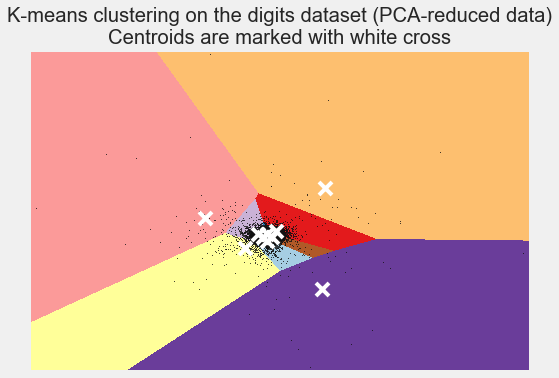

In [895]:
print(__doc__)

from time import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

np.random.seed(42)

X_digits = X_140d
y_digits =target
data =  scale(X_digits)

n_samples, n_features = data.shape
n_digits = len(np.unique(y_digits))
labels = y_digits

sample_size = 42000

print("n_digits: %d, \t n_samples %d, \t n_features %d"
      % (n_digits, n_samples, n_features))


print(82 * '_')
print('init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette')


def bench_k_means(estimator, name, data):
    t0 = time()
    estimator.fit(data)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             metrics.homogeneity_score(labels, estimator.labels_),
             metrics.completeness_score(labels, estimator.labels_),
             metrics.v_measure_score(labels, estimator.labels_),
             metrics.adjusted_rand_score(labels, estimator.labels_),
             metrics.adjusted_mutual_info_score(labels,  estimator.labels_),
             metrics.silhouette_score(data, estimator.labels_,
                                      metric='euclidean',
                                      sample_size=sample_size)))

bench_k_means(KMeans(init='k-means++', n_clusters=n_digits, n_init=10),
              name="k-means++", data=data)

bench_k_means(KMeans(init='random', n_clusters=n_digits, n_init=10),
              name="random", data=data)

# in this case the seeding of the centers is deterministic, hence we run the
# kmeans algorithm only once with n_init=1
pca = PCA(n_components=n_digits).fit(data)
bench_k_means(KMeans(init=pca.components_, n_clusters=n_digits, n_init=1),
              name="PCA-based",
              data=data)
print(82 * '_')

# #############################################################################
# Visualize the results on PCA-reduced data

reduced_data = PCA(n_components=2).fit_transform(data)

kmeans = KMeans(init='k-means++', n_clusters=n_digits, n_init=10)
kmeans.fit(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)\n'
          'Centroids are marked with white cross')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

In [331]:
print(__doc__)

from time import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

np.random.seed(42)

X_digits = training_df
y_digits =Target
data =  scale(X_digits)



Automatically created module for IPython interactive environment


In [339]:
n_samples, n_features = data.shape
n_digits = len(np.unique(y_digits))
labels = y_digits



784

In [342]:
sample_size = 42000

print("n_digits: %d, \t n_samples %d, \t n_features %d"
      % (n_digits, n_samples, n_features))

print(82 * '_')
print('init\t\ttime\tinertia\thomo\tcompl\tv-meas\tARI\tAMI\tsilhouette')

n_digits: 10, 	 n_samples 42000, 	 n_features 784
__________________________________________________________________________________
init		time	inertia	homo	compl	v-meas	ARI	AMI	silhouette


In [ ]:
def bench_k_means(estimator, name, data):
    t0 = time()
    estimator.fit(data)
    print('%-9s\t%.2fs\t%i\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f\t%.3f'
          % (name, (time() - t0), estimator.inertia_,
             metrics.homogeneity_score(labels, estimator.labels_),
             metrics.completeness_score(labels, estimator.labels_),
             metrics.v_measure_score(labels, estimator.labels_),
             metrics.adjusted_rand_score(labels, estimator.labels_),
             metrics.adjusted_mutual_info_score(labels,  estimator.labels_),
             metrics.silhouette_score(data, estimator.labels_,
                                      metric='euclidean',
                                      sample_size=sample_size)))

In [ ]:
bench_k_means(KMeans(init='k-means++', n_clusters=n_digits, n_init=10),
              name="k-means++", data=data)

bench_k_means(KMeans(init='random', n_clusters=n_digits, n_init=10),
              name="random", data=data)

# in this case the seeding of the centers is deterministic, hence we run the
# kmeans algorithm only once with n_init=1
pca = PCA(n_components=n_digits).fit(data)
bench_k_means(KMeans(init=pca.components_, n_clusters=n_digits, n_init=1),
              name="PCA-based",
              data=data)
print(82 * '_')

In [ ]:
# #############################################################################
# Visualize the results on PCA-reduced data

reduced_data = PCA(n_components=2).fit_transform(data)

kmeans = KMeans(init='k-means++', n_clusters=n_digits, n_init=10)
kmeans.fit(data)#(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

In [ ]:
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')


In [ ]:
plt.plot(reduced_data[:, 0], reduced_data[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)\n'
          'Centroids are marked with white cross')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

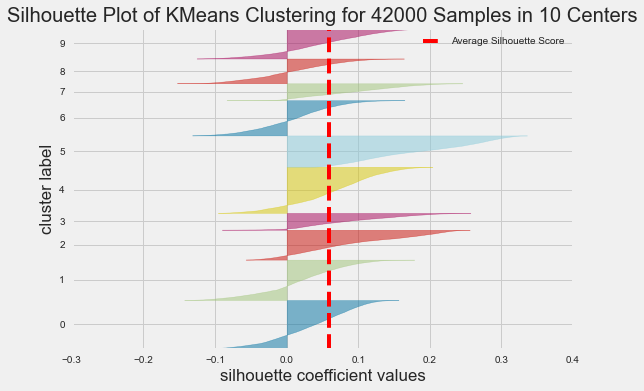

In [1037]:
from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(10, random_state=11)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

visualizer.fit(training_df)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [1038]:
visualizer.silhouette_score_

0.0586296812620352

In [994]:
X_std

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# Silhouette score plot

In [350]:
silhouette_coefficients = []
 
   # Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X_140d)
    score = silhouette_score(X_140d, kmeans.labels_)
    silhouette_coefficients.append(score)

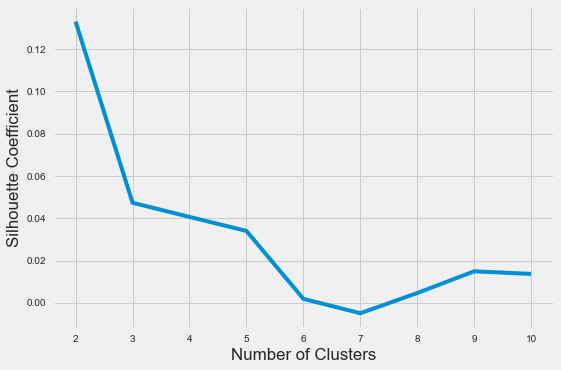

In [351]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

# SSE score plot 

In [424]:
sse = []
for k in range(1, 50,5):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X_140d)
    sse.append(kmeans.inertia_)

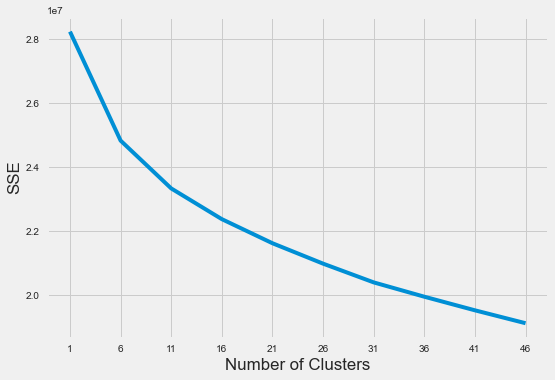

In [425]:
from kneed import KneeLocator

plt.style.use("fivethirtyeight")
plt.plot(range(1, 50,5), sse)
plt.xticks(range(1, 50,5))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [427]:
kl = KneeLocator(range(1, 50,5), sse, curve="convex", direction="decreasing")
 

kl.elbow

11

In [373]:
x_min, x_max = X_140d[:, 0].min() - 1, X_140d[:, 0].max() + 1
y_min, y_max = X_140d[:, 1].min() - 1, X_140d[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

In [374]:
xx.ravel()

array([-10.34031436, -10.32031436, -10.30031436, ...,  32.75968564,
        32.77968564,  32.79968564])

In [ ]:
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(X_140d)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

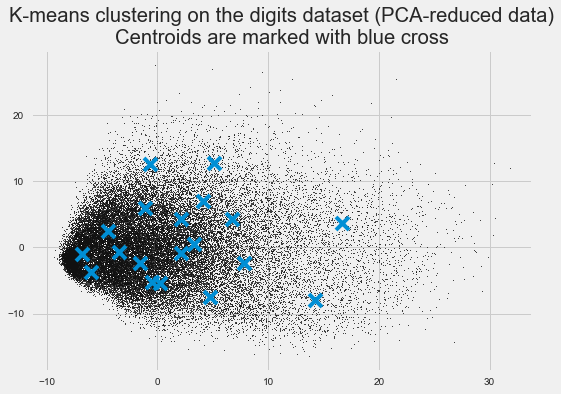

In [399]:
plt.plot(X_140d[:, 0], X_140d[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
             zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)\n'
          'Centroids are marked with blue cross')
#plt.xlim(x_min, x_max)
#plt.ylim(y_min, y_max)
#plt.xticks(())
#plt.yticks(())
plt.show()

In [386]:
centroids[:,0]

array([-0.6358261 ,  4.73271366, -6.28914273, -2.21818081,  2.0074034 ,
        2.54966848, 15.54504859, -4.35519994,  0.73555308,  6.00449914])

array([ 4.73271366e+00,  5.06622135e+00,  9.66908129e+00,  1.15849966e+00,
        1.24931634e+00,  4.67808444e+00, -2.23513031e+00,  2.33465429e+00,
        2.28104408e+00,  2.63195834e+00,  2.07619106e+00, -9.25341651e-01,
       -1.53361698e+00, -4.62691020e-01, -6.30866164e-01, -2.90670949e-01,
        1.78655334e-01,  8.61797108e-01,  9.33419632e-01,  1.22475569e+00,
        3.83460651e-01, -2.68672311e-01, -1.96188235e-01,  7.48304579e-02,
       -3.24477708e-01,  2.59242486e-01, -5.83555468e-01,  6.43815503e-02,
        4.33196872e-01, -1.83132668e-01, -5.62467324e-01,  6.15040900e-03,
       -6.84989497e-01,  1.14237649e-01, -1.45808709e-01, -4.40624110e-01,
       -2.47090552e-01, -8.62308098e-02, -2.03771433e-01, -1.45922825e-01,
       -9.34749372e-02,  2.13571398e-01, -3.47507542e-03, -2.09291131e-01,
       -1.90066955e-01,  6.84392304e-02, -4.80661587e-02,  3.12464610e-01,
        8.07480396e-02,  7.70396564e-02, -2.69070408e-02,  1.05058857e-01,
        1.22617094e-01, -